In [1]:
import os
import math
import warnings
warnings.filterwarnings("ignore")

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from matplotlib_venn import venn3, venn2
from plotly import tools
from IPython.core import display as ICD
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', 5000)

In [2]:
df = pd.read_csv('/Users/kaitaidong/Downloads/kaggle-survey-2018/multipleChoiceResponses.csv').iloc[1:,:]
df.head()

,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,Q7,Q7_OTHER_TEXT,Q8,Q9,Q10,Q11_Part_1,Q11_Part_2,Q11_Part_3,Q11_Part_4,Q11_Part_5,Q11_Part_6,Q11_Part_7,Q11_OTHER_TEXT,Q12_MULTIPLE_CHOICE,Q12_Part_1_TEXT,Q12_Part_2_TEXT,Q12_Part_3_TEXT,Q12_Part_4_TEXT,Q12_Part_5_TEXT,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15,Q13_OTHER_TEXT,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER_TEXT,Q15_Part_1,Q15_Part_2,Q15_Part_3,Q15_Part_4,Q15_Part_5,Q15_Part_6,Q15_Part_7,Q15_OTHER_TEXT,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_Part_16,Q16_Part_17,Q16_Part_18,Q16_OTHER_TEXT,Q17,Q17_OTHER_TEXT,Q18,Q18_OTHER_TEXT,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_Part_6,Q19_Part_7,Q19_Part_8,Q19_Part_9,Q19_Part_10,Q19_Part_11,Q19_Part_12,Q19_Part_13,Q19_Part_14,Q19_Part_15,Q19_Part_16,Q19_Part_17,Q19_Part_18,Q19_Part_19,Q19_OTHER_TEXT,Q20,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_Part_6,Q21_Part_7,Q21_Part_8,Q21_Part_9,Q21_Part_10,Q21_Part_11,Q21_Part_12,Q21_Part_13,Q21_OTHER_TEXT,Q22,Q22_OTHER_TEXT,Q23,Q24,Q25,Q26,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_Part_7,Q27_Part_8,Q27_Part_9,Q27_Part_10,Q27_Part_11,Q27_Part_12,Q27_Part_13,Q27_Part_14,Q27_Part_15,Q27_Part_16,Q27_Part_17,Q27_Part_18,Q27_Part_19,Q27_Part_20,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_Part_13,Q28_Part_14,Q28_Part_15,Q28_Part_16,Q28_Part_17,Q28_Part_18,Q28_Part_19,Q28_Part_20,Q28_Part_21,Q28_Part_22,Q28_Part_23,Q28_Part_24,Q28_Part_25,Q28_Part_26,Q28_Part_27,Q28_Part_28,Q28_Part_29,Q28_Part_30,Q28_Part_31,Q28_Part_32,Q28_Part_33,Q28_Part_34,Q28_Part_35,Q28_Part_36,Q28_Part_37,Q28_Part_38,Q28_Part_39,Q28_Part_40,Q28_Part_41,Q28_Part_42,Q28_Part_43,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_Part_13,Q29_Part_14,Q29_Part_15,Q29_Part_16,Q29_Part_17,Q29_Part_18,Q29_Part_19,Q29_Part_20,Q29_Part_21,Q29_Part_22,Q29_Part_23,Q29_Part_24,Q29_Part_25,Q29_Part_26,Q29_Part_27,Q29_Part_28,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_Part_13,Q30_Part_14,Q30_Part_15,Q30_Part_16,Q30_Part_17,Q30_Part_18,Q30_Part_19,Q30_Part_20,Q30_Part_21,Q30_Part_22,Q30_Part_23,Q30_Part_24,Q30_Part_25,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32,Q32_OTHER,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_OTHER_TEXT,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q35_OTHER_TEXT,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_Part_10,Q36_Part_11,Q36_Part_12,Q36_Part_13,Q36_OTHER_TEXT,Q37,Q37_OTHER_TEXT,Q38_Part_1,Q38_Part_2,Q38_Part_3,Q38_Part_4,Q38_Part_5,Q38_Part_6,Q38_Part_7,Q38_Part_8,Q38_Part_9,Q38_Part_10,Q38_Part_11,Q38_Part_12,Q38_Part_13,Q38_Part_14,Q38_Part_15,Q38_Part_16,Q38_Part_17,Q38_Part_18,Q38_Part_19,Q38_Part_20,Q38_Part_21,Q38_Part_22,Q38_OTHER_TEXT,Q39_Part_1,Q39_Part_2,Q40,Q41_Part_1,Q41_Part_2,Q41_Part_3,Q42_Part_1,Q42_Part_2,Q42_Part_3,Q42_Part_4,Q42_Part_5,Q42_OTHER_TEXT,Q43,Q44_Part_1,Q44_Part_2,Q44_Part_3,Q44_Part_4,Q44_Part_5,Q44_Part_6,Q45_Part_1,Q45_Part_2,Q45_P

In [6]:
df[['Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5',
             'Q13_Part_6','Q13_Part_7','Q13_Part_8','Q13_Part_9','Q13_Part_10',
             'Q13_Part_11','Q13_Part_12','Q13_Part_13','Q13_Part_14','Q13_Part_15']].drop(0) # drop the first row

,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15
1,Jupyter/IPython,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,MATLAB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Jupyter/IPython,RStudio,PyCharm,NaN,NaN,NaN,NaN,Visual Studio,NaN,NaN,Vim,NaN,NaN,NaN,NaN
5,NaN,RStudio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Jupyter/IPython,NaN,NaN,NaN,NaN,Atom,NaN,NaN,NaN,NaN,Vim,NaN,NaN,NaN,NaN
7,NaN,RStudio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Jupyter/IPython,NaN,PyCharm,NaN,NaN,Atom,NaN,Visual Studio,Notepad++,Sublime Text,NaN,IntelliJ,Spyder,NaN,NaN
9,Jupyter/IPython,NaN,NaN,NaN,NaN,NaN,MATLAB,Visual Studio,NaN,NaN,NaN,NaN,Spyder,NaN,NaN
10,Jupyter/IPython,NaN,PyCharm,Visual Studio Code,NaN,NaN,NaN,Visual Studio,NaN,Sublime Text,NaN,IntelliJ,NaN,NaN,NaN


In [3]:
# Pull just IDE Questions
ide_qs = df[['Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5',
             'Q13_Part_6','Q13_Part_7','Q13_Part_8','Q13_Part_9','Q13_Part_10',
             'Q13_Part_11','Q13_Part_12','Q13_Part_13','Q13_Part_14','Q13_Part_15']].drop(0)

# Rename Columns for IDE Type
column_rename = {'Q13_Part_1': 'Jupyter/IPython',
                 'Q13_Part_2': 'RStudio',
                'Q13_Part_3': 'PyCharm',
                'Q13_Part_4': 'Visual Studio Code',
                'Q13_Part_5': 'nteract',
                'Q13_Part_6': 'Atom',
                'Q13_Part_7': 'MATLAB',
                'Q13_Part_8': 'Visual Studio',
                'Q13_Part_9': 'Notepad++',
                'Q13_Part_10': 'Sublime Text',
                'Q13_Part_11': 'Vim',
                'Q13_Part_12': 'IntelliJ',
                'Q13_Part_13': 'Spyder',
                'Q13_Part_14': 'None',
                'Q13_Part_15': 'Other',
                }

# Make binary columns from IDE answers.
ide_qs_binary = ide_qs.rename(columns=column_rename).fillna(0).replace('[^\\d]',1, regex=True)
df_and_ide = pd.concat([df.drop(0), ide_qs_binary], axis=1)

In [3]:
CONSIDERED_JOB_TITLE = ['Business Analyst', 'Chief Officer', 'Consultant',
       'DBA/Database Engineer', 'Data Analyst', 'Data Engineer',
       'Data Journalist', 'Data Scientist', 'Developer Advocate',
       'Manager', 'Marketing Analyst','Principal Investigator', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Salesperson',
       'Software Engineer', 'Statistician']

df_jobs = df.loc[df["Q6"].isin(CONSIDERED_JOB_TITLE)]

In [4]:
df_plot = df_jobs['Q6'].value_counts(ascending=True)  # or use plot_df[::-1] to reverse the order

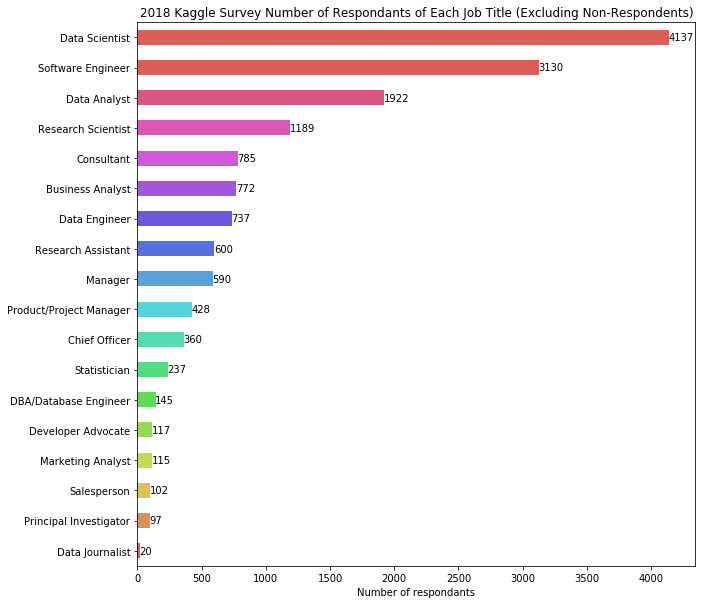

In [6]:
color_pal = sns.color_palette('hls', 16)
ax = df_plot.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Number of Respondants of Each Job Title (Excluding Non-Respondents)',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot.index, df_plot.values)):
    plt.text(s=str(pr), x=pr-5, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("Number of respondants")
plt.show()

In [7]:
# Create another pd.Series to show the percentage of each category
df_plot_perc = pd.Series((df_plot.values / df_plot.sum() *100).round(2), index = df_plot.index)

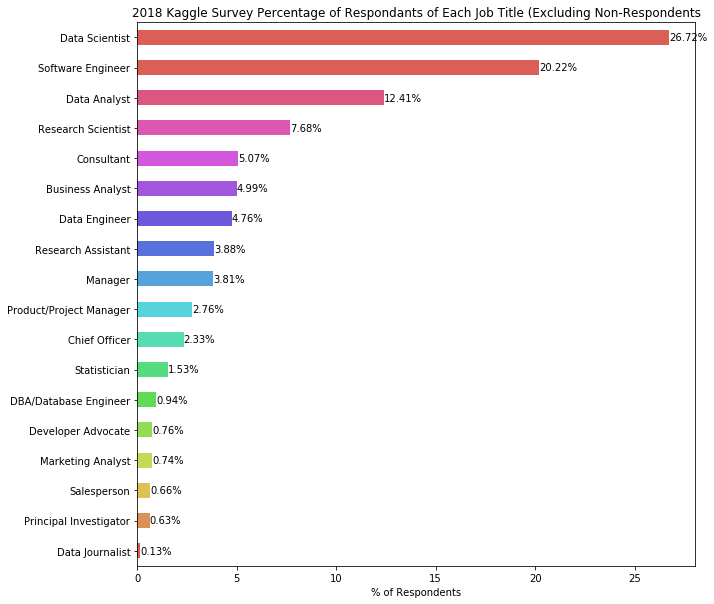

In [8]:
ax = df_plot_perc.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Percentage of Respondants of Each Job Title (Excluding Non-Respondents',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot_perc.index, df_plot_perc.values)):
    plt.text(s=str(pr)+"%", x=pr, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("% of Respondents")
plt.show()

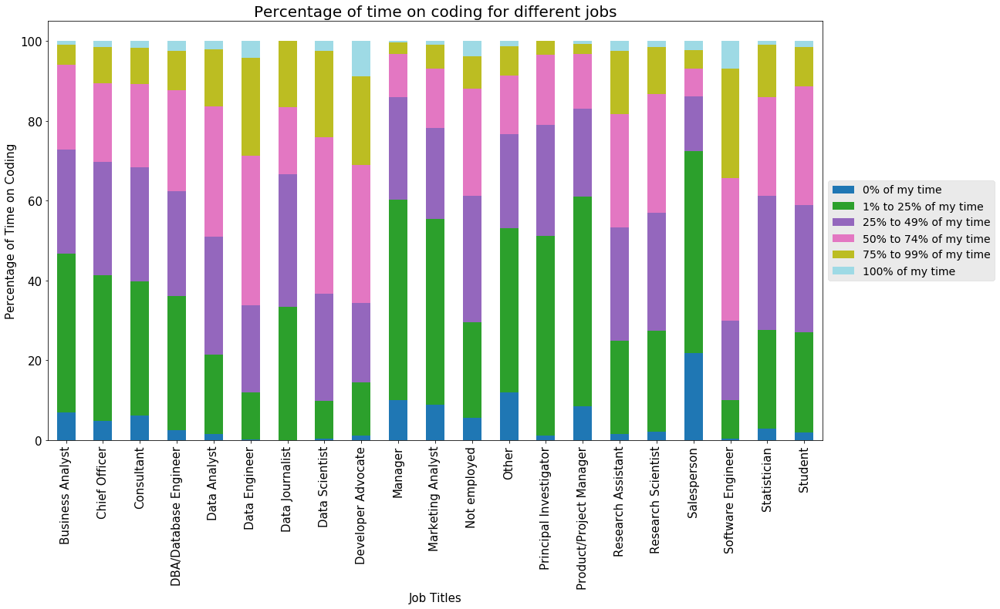

In [9]:
CODING_TIME = ['0% of my time', '1% to 25% of my time',
       '25% to 49% of my time','50% to 74% of my time', 
       '75% to 99% of my time', '100% of my time']

df[["Q6", "Q23"]]\
        .dropna().groupby(["Q6", "Q23"]).size()\
        .groupby("Q6").apply(lambda x: 100 * x / float(x.sum()))\
        .unstack(1)[CODING_TIME]\
        .plot(kind="bar", stacked=True, figsize=(18, 10), 
              fontsize=15, colormap=plt.get_cmap("tab20")
             )

plt.style.use("ggplot")
plt.title("Percentage of time on coding for different jobs", fontsize=20)
plt.ylabel("Percentage of Time on Coding", fontsize=15)
plt.xlabel("Job Titles", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()


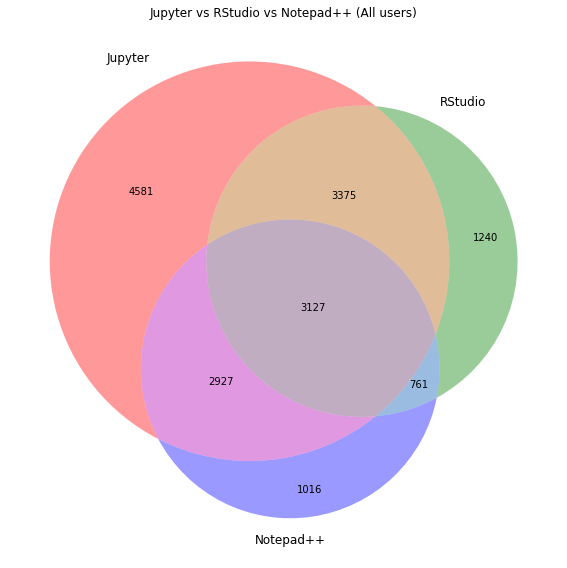

In [8]:
plt.figure(figsize=(15, 8))

venn3(subsets=(len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 0)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1)]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1)])),
      set_labels=('Jupyter', 'RStudio', 'Notepad++'))
plt.title('Jupyter vs RStudio vs Notepad++ (All users)')
plt.tight_layout()
plt.show()

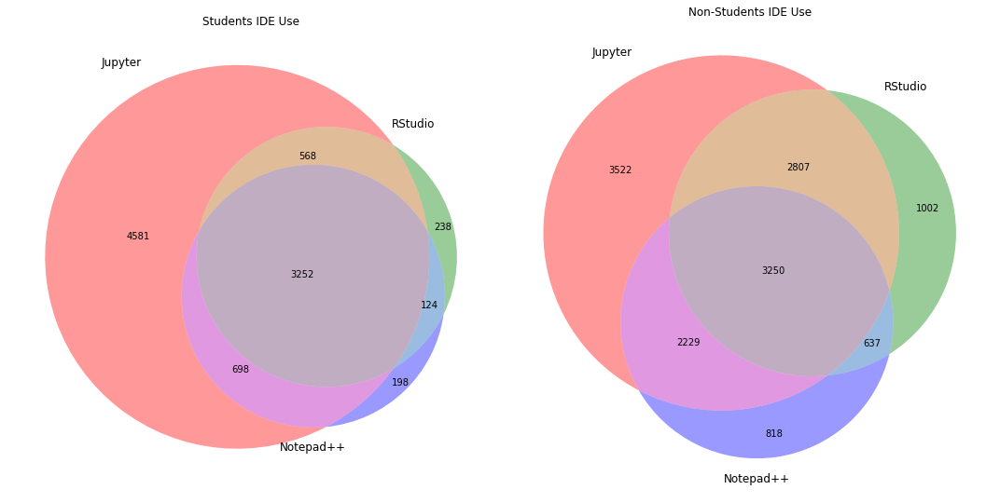

In [10]:
# Venn Diagram of 
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
venn3(subsets=(len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 0 & (df_and_ide['Q6'] == 'Student'))]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)& (df_and_ide['Q6'] == 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)& (df_and_ide['Q6'] == 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] == 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] == 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] == 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1& (df_and_ide['Q6'] == 'Student'))])),
      set_labels=('Jupyter', 'RStudio', 'Notepad++'))
plt.title('Students IDE Use')
plt.subplot(1, 2, 2)
venn3(subsets=(len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 0) & (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)& (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 0)& (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 0) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 0) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1)& (df_and_ide['Q6'] != 'Student')]),
               len(ide_qs_binary.loc[(ide_qs_binary['Jupyter/IPython'] == 1) & (ide_qs_binary['RStudio'] == 1) & (ide_qs_binary['Notepad++'] == 1& (df_and_ide['Q6'] != 'Student'))])),
      set_labels=('Jupyter', 'RStudio', 'Notepad++'))
plt.title('Non-Students IDE Use')
plt.tight_layout()
plt.show()

In [14]:
responses = df[1:]
responses = responses[~pd.isnull(responses['Q35_Part_1'])]

In [15]:
count_dict = {
    'Self-taught' : (responses['Q35_Part_1'].astype(float)>0).sum(),
    'Online courses (Coursera, Udemy, edX, etc.)' : (responses['Q35_Part_2'].astype(float)>0).sum(),
    'Work' : (responses['Q35_Part_3'].astype(float)>0).sum(),
    'University' : (responses['Q35_Part_4'].astype(float)>0).sum(),
    'Kaggle competitions' : (responses['Q35_Part_5'].astype(float)>0).sum(),
    'Other' : (responses['Q35_Part_6'].astype(float)>0).sum()
}

cnt_srs = pd.Series(count_dict)

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color='blue',
    #    colorscale = 'Picnic',
    #    reversescale = True
    ),
)

layout = go.Layout(
    title='Number of respondents for each learning category'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="learningcategory")

In [16]:
responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   

ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
#colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

trace = []

for i in range(6):
    trace.append ( 
        go.Box(
            y=ys[i],
            name=names[i],
            marker = dict(
                color=colors[i],
            )
        )
    )
layout = go.Layout(
    title='Box plots on % contribution of each ML / DS training category'
)

fig = go.Figure(data=trace, layout=layout)
iplot(fig, filename="TimeSpent")

In [19]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q3"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["United States of America", "India", "China", "Russia", "Brazil", "Germany",
                "United Kingdom of Great Britain and Northern Ireland", "Canada", "France", "Japan"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.1, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=2000, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Country", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]



In [21]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q6"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
                    )
    return trace
    
traces_list = []
country_names = ["Student", "Data Scientist", "Software Engineer", "Data Analyst"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Profession", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



In [22]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q4"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["Master’s degree", "Bachelor’s degree", "Doctoral degree", "Professional degree"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Degree", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



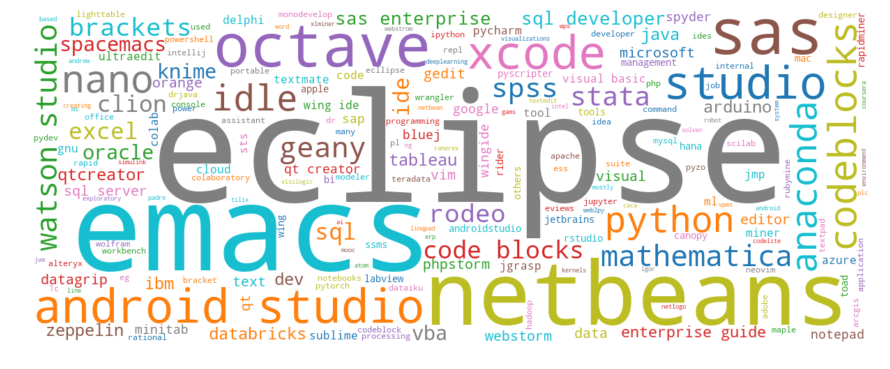

In [24]:
# Load freeform responses
ff = pd.read_csv('/Users/kaitaidong/Downloads/kaggle-survey-2018/freeFormResponses.csv')

# Format into lower strings
ff['count'] = 1
ff['IDE_lower'] = ff['Q13_OTHER_TEXT'].str.lower()
ff.drop(0)[['IDE_lower','count']].groupby('IDE_lower').sum()[['count']].sort_values('count', ascending=False)

# Create wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.figure(figsize=[15,8])

# Create and generate a word cloud image:
ide_words = ' '.join(ff['IDE_lower'].drop(0).dropna().values)
wordcloud = WordCloud(colormap="tab10",
                      width=1200,
                      height=480,
                      normalize_plurals=False,
                      background_color="white",
                      random_state=5).generate(ide_words)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [25]:
CONSIDERED_JOB_TITLE = ['Business Analyst', 'Chief Officer', 'Consultant',
       'DBA/Database Engineer', 'Data Analyst', 'Data Engineer',
       'Data Journalist', 'Data Scientist', 'Developer Advocate',
       'Manager', 'Marketing Analyst','Principal Investigator', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Salesperson',
       'Software Engineer', 'Statistician']

In [26]:
mcr_jobs = df.loc[df["Q6"].isin(CONSIDERED_JOB_TITLE)]

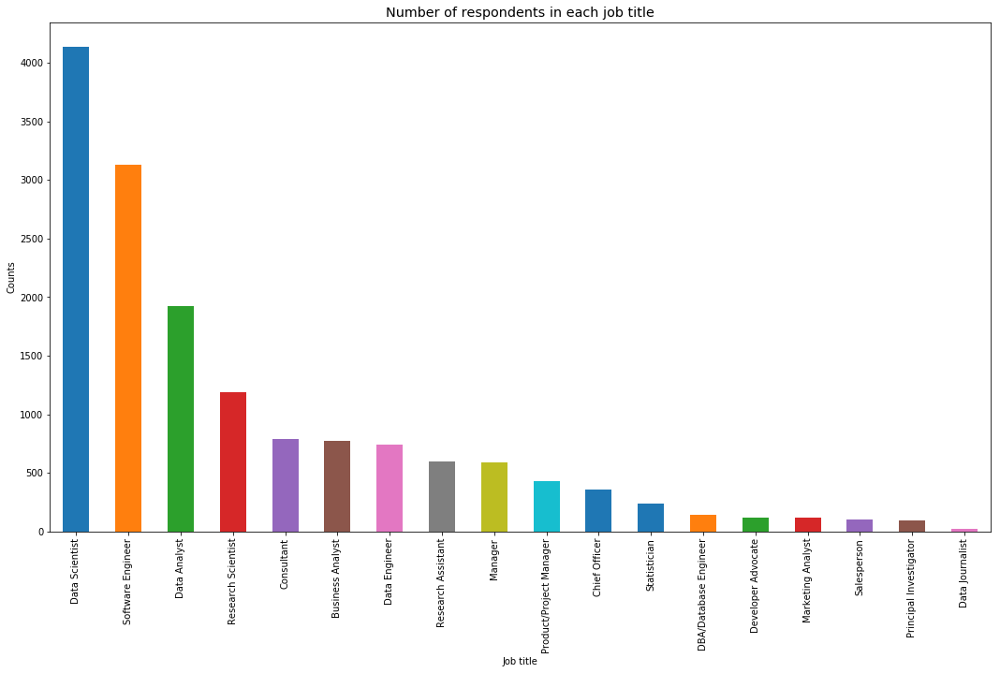

In [27]:
plt.figure(figsize=(18, 10))
mcr_jobs["Q6"].value_counts().plot(kind='bar')
_ = plt.style.use('ggplot')
_ = plt.title("Number of respondents in each job title")
_ = plt.xlabel("Job title")
_ = plt.ylabel("Counts")

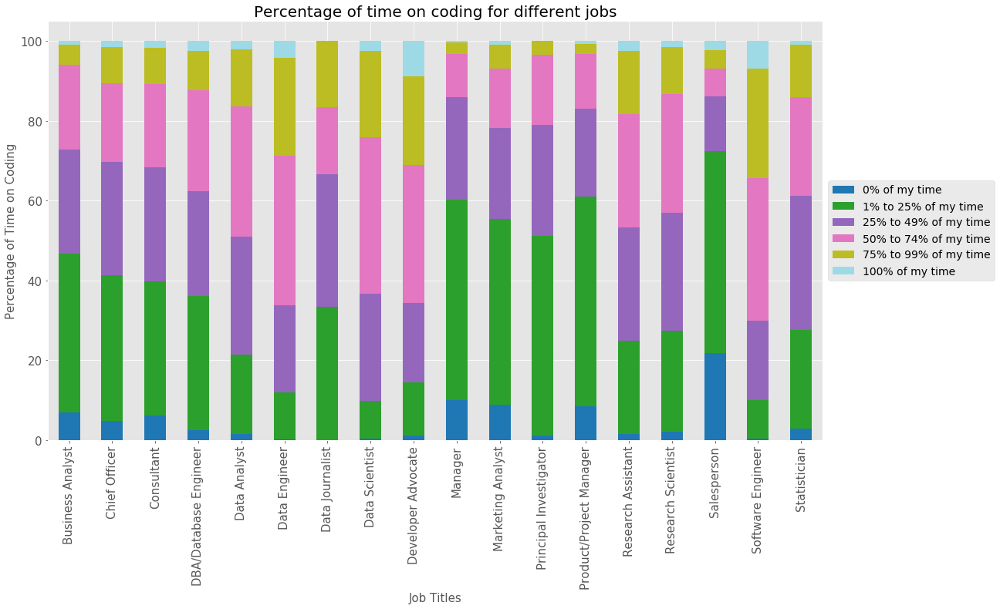

In [28]:
CODING_TIME = ['0% of my time', '1% to 25% of my time',
       '25% to 49% of my time','50% to 74% of my time', 
       '75% to 99% of my time', '100% of my time']

mcr_jobs[["Q6", "Q23"]]\
        .dropna().groupby(["Q6", "Q23"]).size()\
        .groupby("Q6").apply(lambda x: 100 * x / float(x.sum()))\
        .unstack(1)[CODING_TIME]\
        .plot(kind="bar", stacked=True, figsize=(18, 10), 
              fontsize=15, colormap=plt.get_cmap("tab20")
             )

plt.style.use("ggplot")
plt.title("Percentage of time on coding for different jobs", fontsize=20)
plt.ylabel("Percentage of Time on Coding", fontsize=15)
plt.xlabel("Job Titles", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()


In [29]:
CODING_YEAR = ['I have never written code and I do not want to learn',
        'I have never written code but I want to learn', '< 1 year', '1-2 years', 
        '3-5 years', '5-10 years', '10-20 years', '20-30 years', 
        '30-40 years', '40+ years']
mcr_code_year = mcr_jobs[["Q6", "Q24"]]\
        .groupby(["Q6", "Q24"])\
        .size()\
        .to_frame("counts")\
        .unstack(1)\
        .fillna(0)
mcr_code_year = mcr_code_year["counts"][CODING_YEAR]

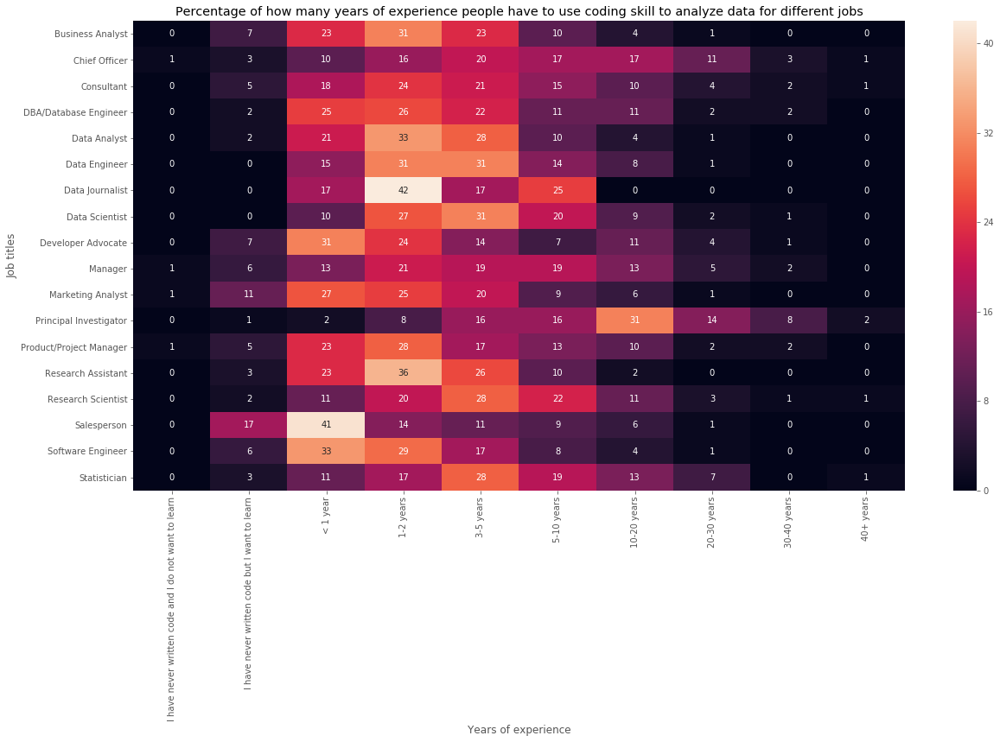

In [30]:
mcr_code_year = mcr_code_year.apply(lambda x: ((x / mcr_code_year.sum(axis=1)) * 100).round(0))
plt.figure(figsize=(20, 10))
sns.heatmap(mcr_code_year, annot=True)
_ = plt.title("Percentage of how many years of experience people have to use coding skill to analyze data for different jobs")
_ = plt.xlabel("Years of experience")
_ = plt.ylabel("Job titles")

In [32]:
DATA_TYPE_LIST = ['Audio Data', 'Categorical Data', 'Genetic Data',
       'Geospatial Data', 'Image Data', 'Numerical Data', 'Sensor Data',
       'Tabular Data', 'Text Data', 'Time Series Data', 'Video Data',
       'Other Data']
mcr_data_type = mcr_jobs.filter(regex="^(?!.*TEXT)(Q31)").fillna(0)
ori_list = mcr_data_type.columns.tolist()

for col in mcr_data_type:
    mcr_data_type[col] = mcr_data_type[col].apply(lambda x: 1 if x!=0 else 0)
    
mcr_data_type = mcr_data_type.rename(columns=dict(zip(ori_list, DATA_TYPE_LIST)))
mcr_data_type = mcr_data_type.merge(mcr_jobs[["Q6"]], left_index=True, right_index=True)
sum_datatype = mcr_data_type.groupby("Q6")[DATA_TYPE_LIST].sum().T



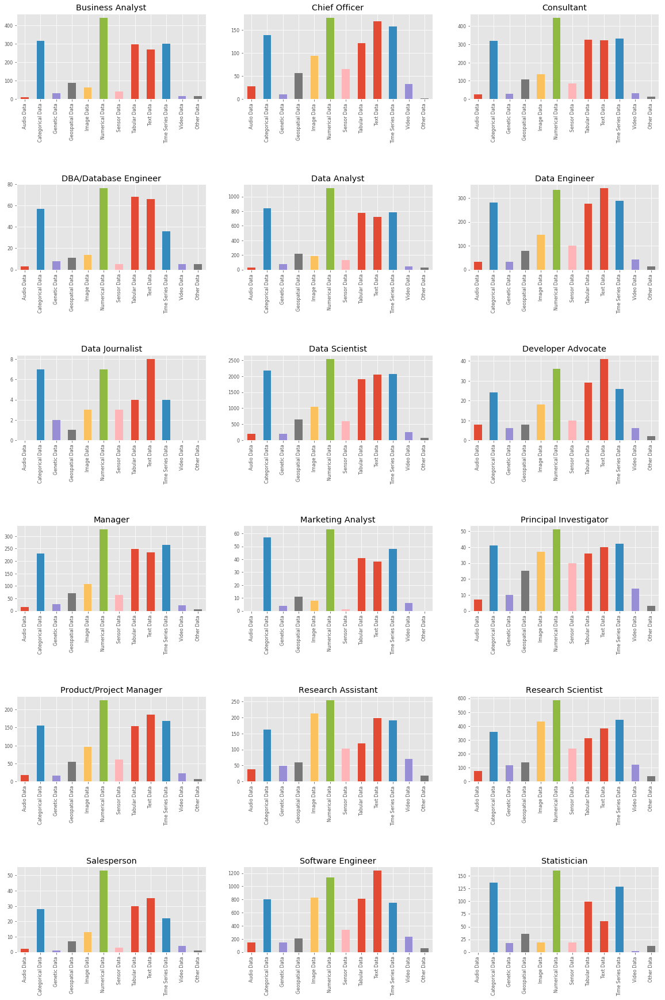

In [33]:
fig, ax = plt.subplots(nrows=6, ncols=3, sharex=True, sharey=True, figsize=(20, 30))
n = 1
for job in sum_datatype:
    plt.subplot(6, 3, n)
    sum_datatype[job].plot(kind="bar", title=job, fontsize=8)
    n +=1
plt.subplots_adjust(hspace = 1)
plt.show()

In [34]:
WORK_DETAILS = ['Gathering data', 'Cleaning data', 
            'Visualizing data', 'Model building/model selection', 
            'Putting the model into production', 
            'Finding insights in the data and communicating with stakeholders']
mcr_time = mcr_jobs.filter(regex=("^(?!.*TEXT)(Q6|Q34)"), axis=1)\
                .dropna()
mcr_time.columns = ["Q6"] + WORK_DETAILS
mcr_time[WORK_DETAILS] = mcr_time[WORK_DETAILS].astype(float)

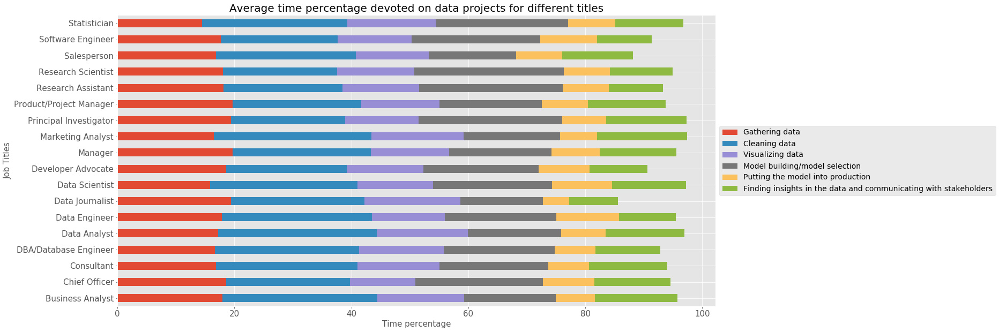

In [35]:
mcr_time.groupby("Q6").agg(np.mean)\
    .plot.barh(stacked=True, figsize=(20, 10), fontsize=15)

plt.title("Average time percentage devoted on data projects for different titles", fontsize=20)
plt.ylabel("Job Titles", fontsize=15)
plt.xlabel("Time percentage", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()